In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.io import loadmat
from sklearn.model_selection import train_test_split
from sklearn import ensemble
%matplotlib inline


c:\Users\ZSY\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# 使用loadmat函数加载.mat文件
raw_data = loadmat('F:/MachineLearning/MachineLearning_HW_CQUT-master/HW4 emsemble/data1.mat')
# 将前两列特征和最后一列目标值读入data中
X=raw_data['X']
y=raw_data['y']
#将数据集按照7:3的比率划分训练集和验证集。
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=1,train_size=0.7,test_size=0.3)

In [3]:
y.flatten()

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

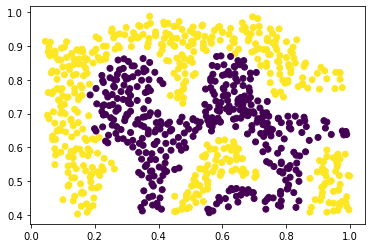

In [4]:
plt.scatter(X[:,0],X[:,1],c=y.flatten())

In [5]:
# 定义SVM模型
model = ensemble.AdaBoostClassifier(base_estimator=None, n_estimators=50, random_state=42)
# 对模型进行训练
model.fit(X_train, y_train.ravel())

AdaBoostClassifier(random_state=42)

In [6]:
model.score(X_train, y_train.ravel())

0.9354304635761589

In [15]:
def plot_predict(model,axes):
    x0s = np.linspace(axes[0],axes[1],100)
    x1s = np.linspace(axes[2],axes[3],100)
    x0, x1 = np.meshgrid(x0s,x1s)
    X = np.c_[x0.ravel(),x1.ravel()]
    y_pred = model.predict(X).reshape(x0.shape)
    y_decision = model.decision_function(X).reshape(x0.shape)
    plt.contour(x0,x1,y_pred,cmap=plt.cm.winter)
    plt.contour(x0,x1,y_decision,cmap=plt.cm.winter,alpha=0.2)
    plt.show()

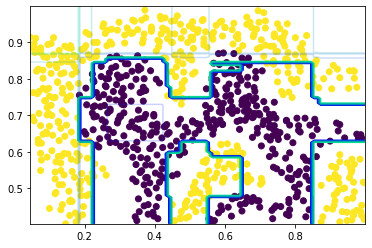

In [8]:
plt.scatter(X[:,0],X[:,1],c=y.flatten())
plot_predict(model,[X[:,0].min(),X[:,0].max(),X[:,1].min(),X[:,0].max()])

In [19]:
y_pred = (model.predict(X_test).reshape(-1, 1))
acc = np.sum(y_pred==y_test)/y_test.shape[0]
print('val_acc:',acc)

val_acc: 0.8996138996138996


1


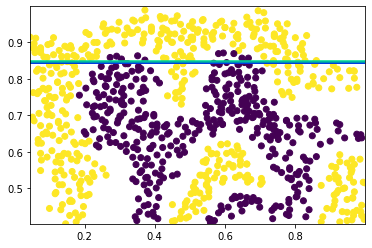

2


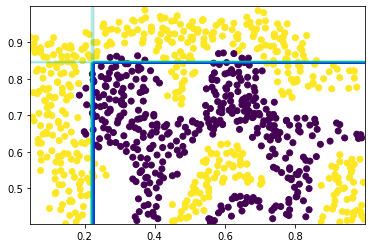

3


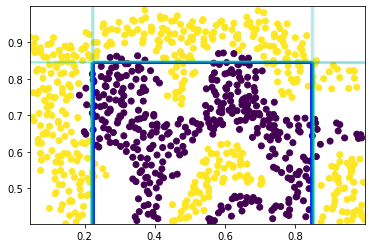

4


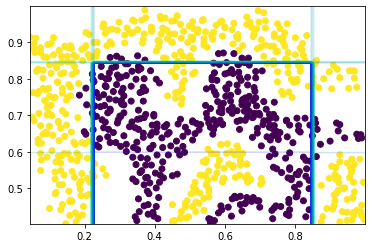

5


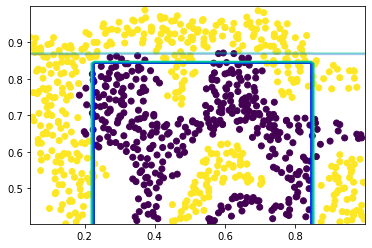

6


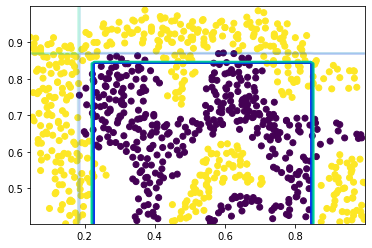

7


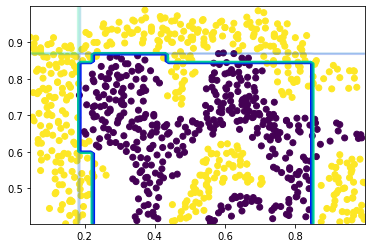

8


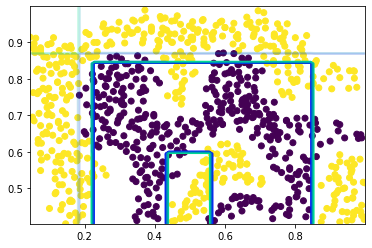

9


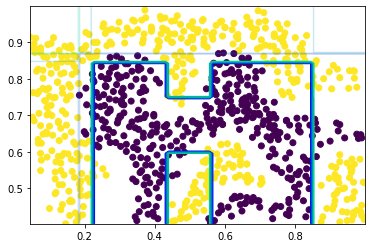

10


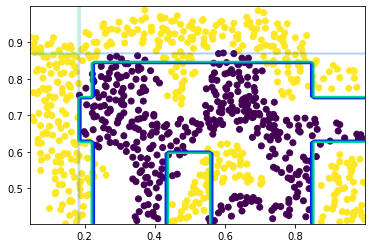

11


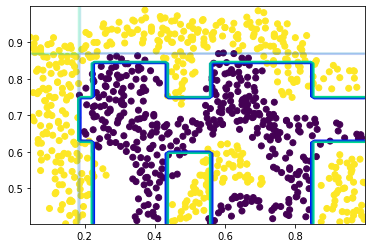

12


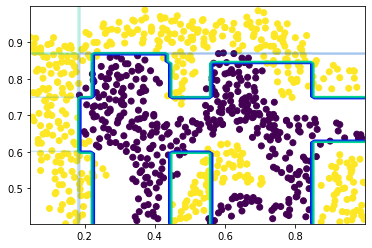

13


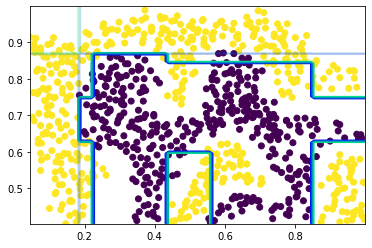

14


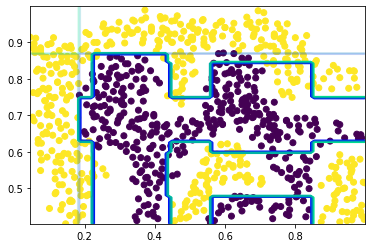

15


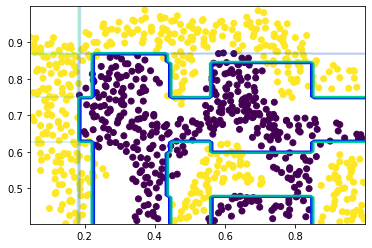

16


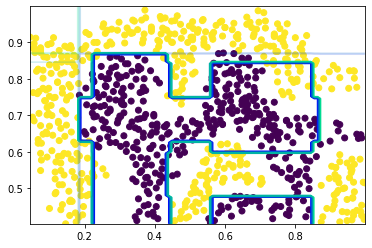

17


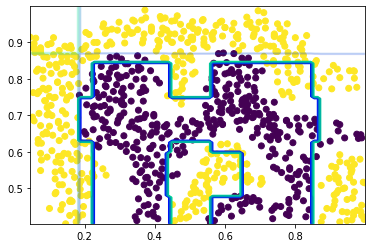

18


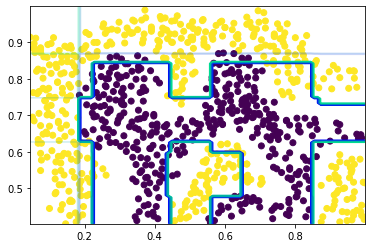

19


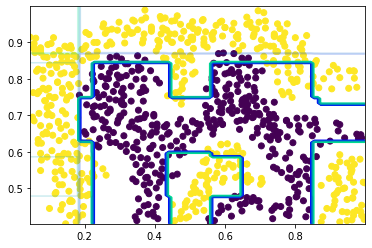

20


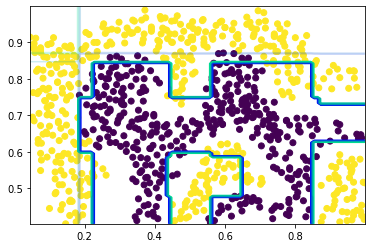

21


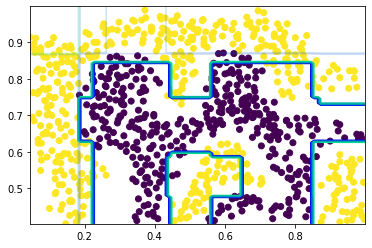

22


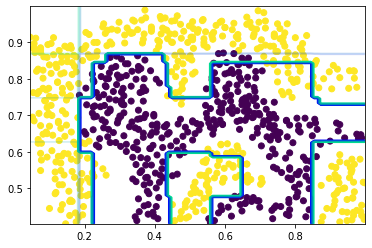

23


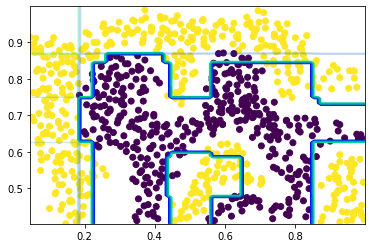

24


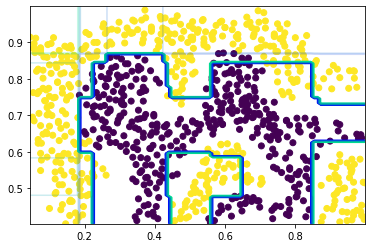

25


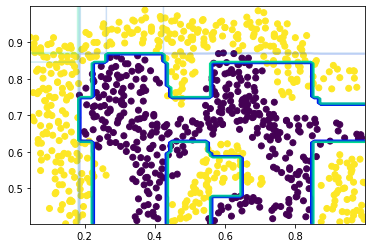

26


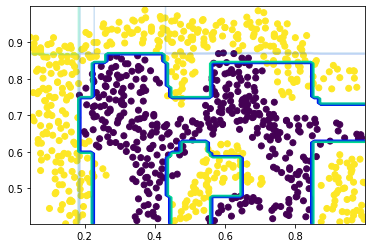

27


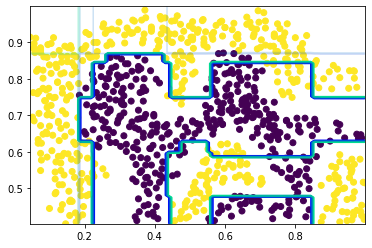

28


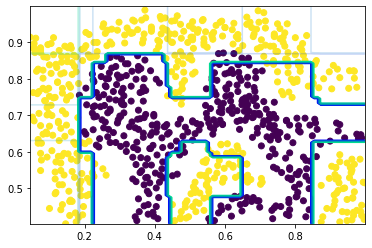

29


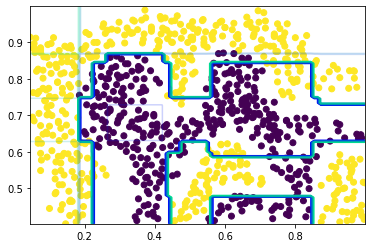

30


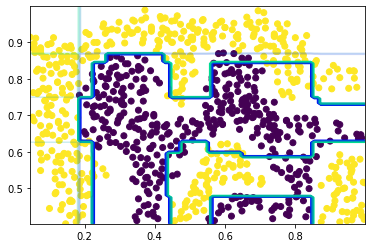

31


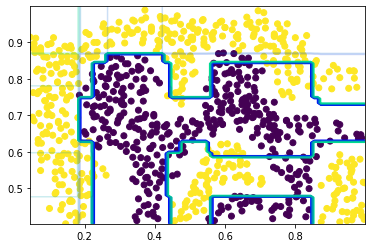

32


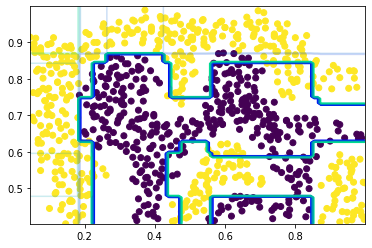

33


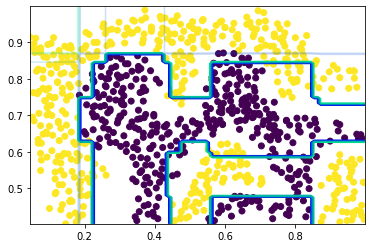

34


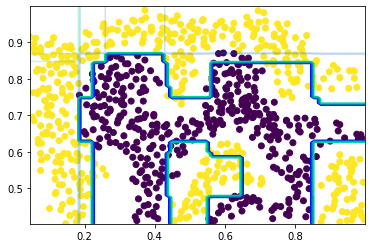

35


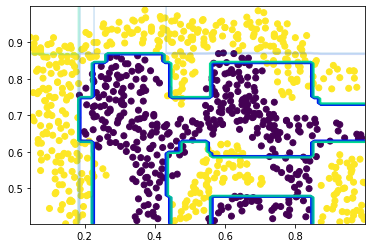

36


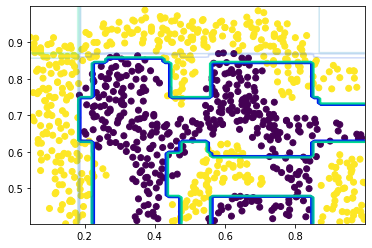

37


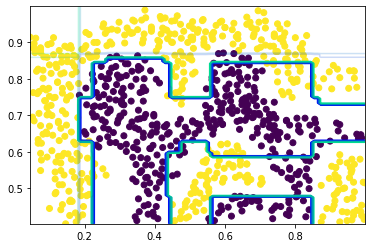

38


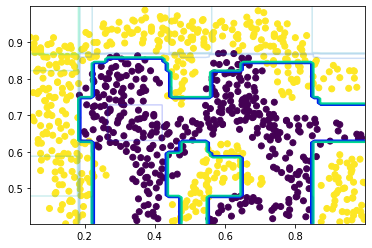

39


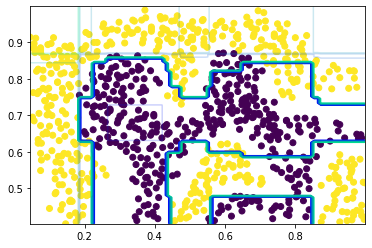

40


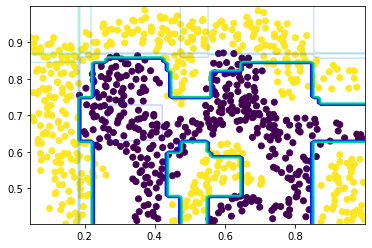

41


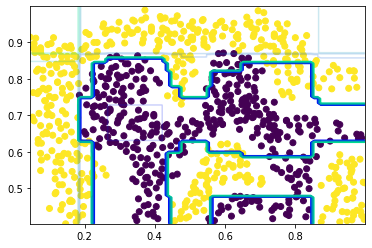

42


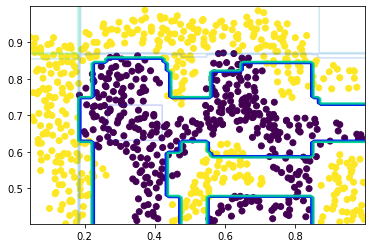

43


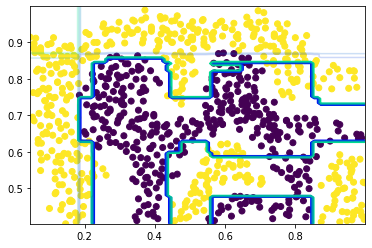

44


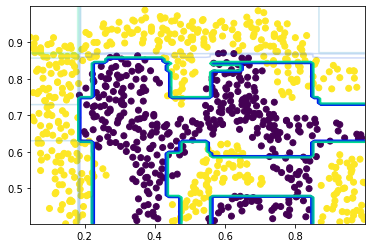

45


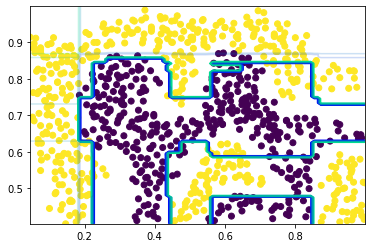

46


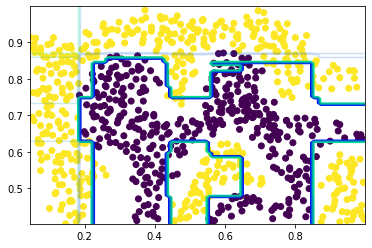

47


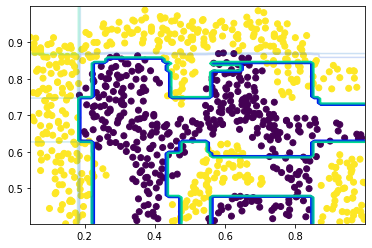

48


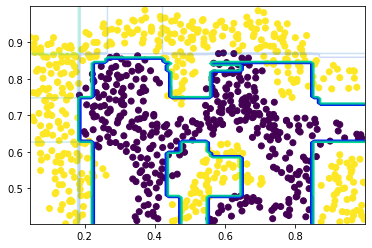

49


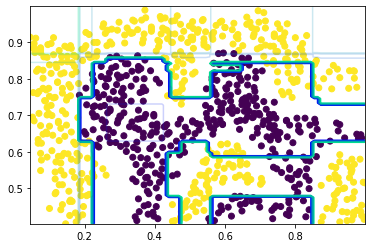

50


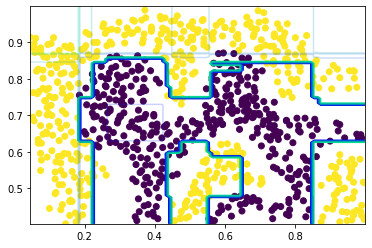

51


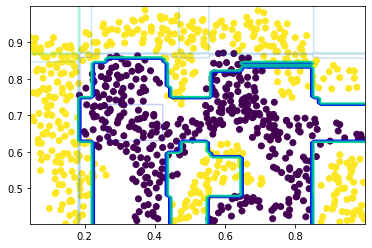

52


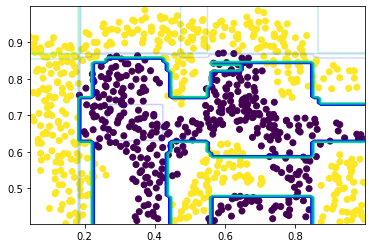

53


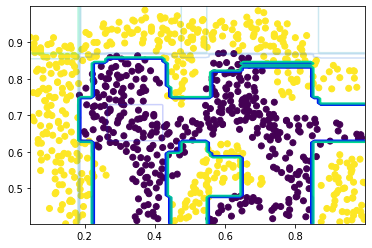

54


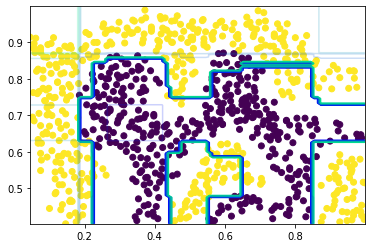

55


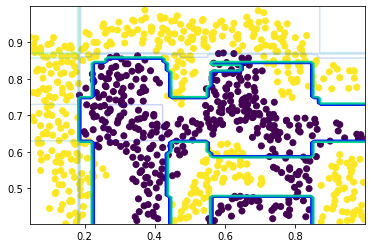

56


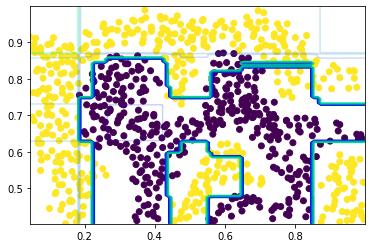

57


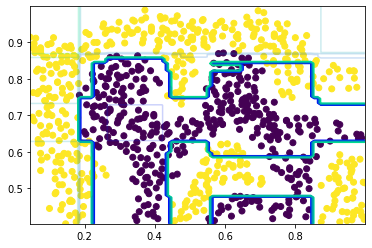

58


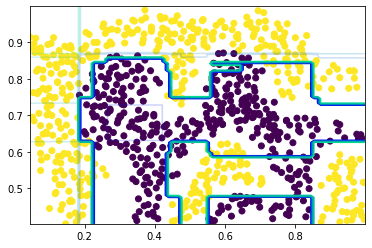

59


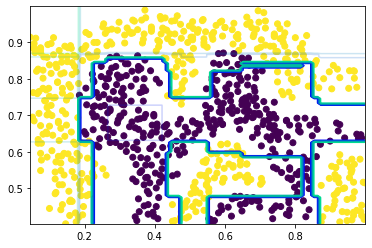

60


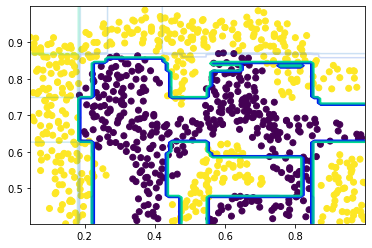

61


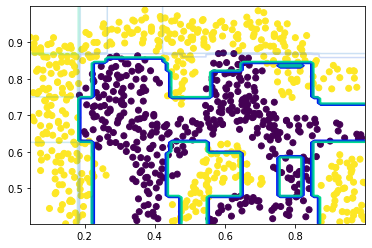

62


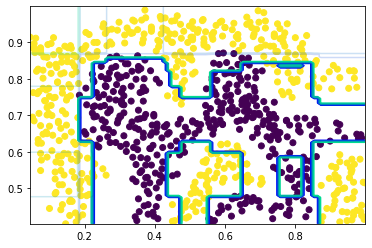

63


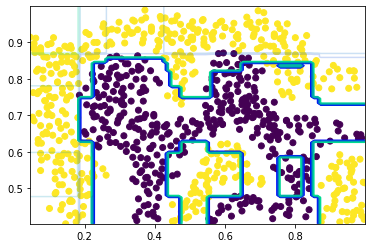

64


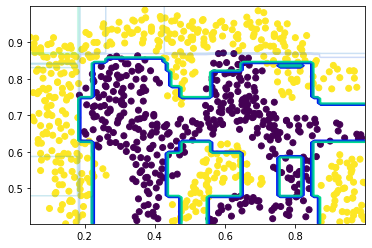

65


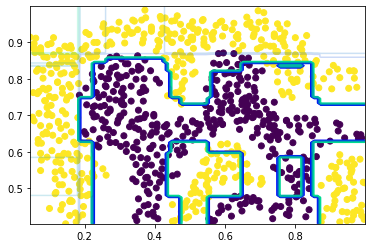

66


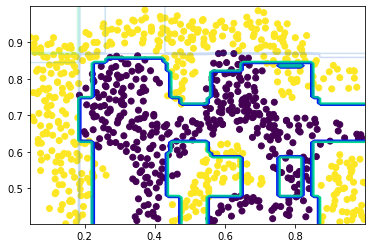

67


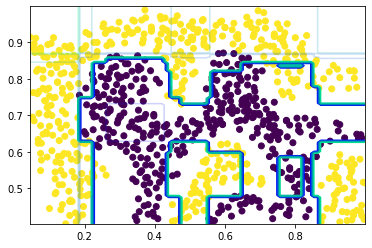

68


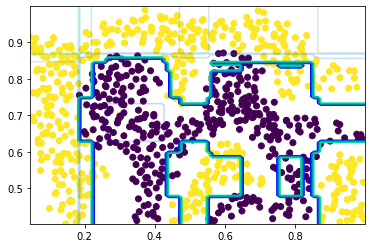

69


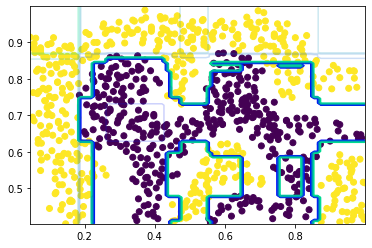

70


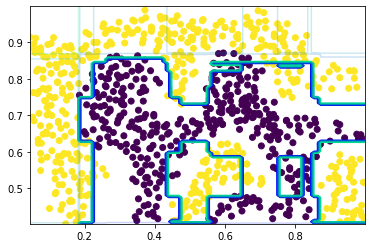

71


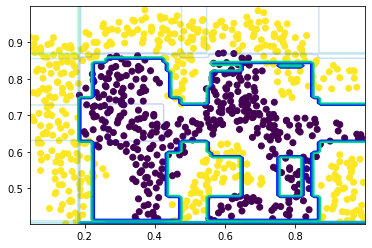

72


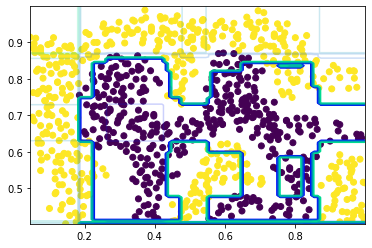

73


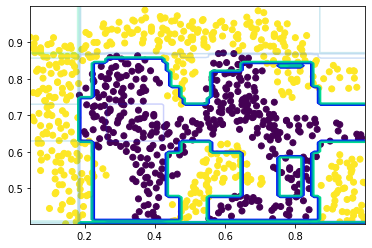

74


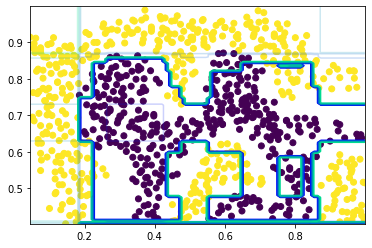

75


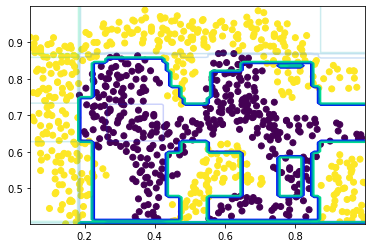

76


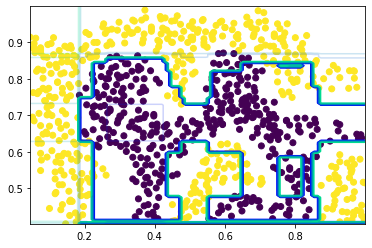

77


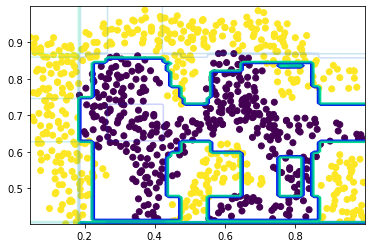

78


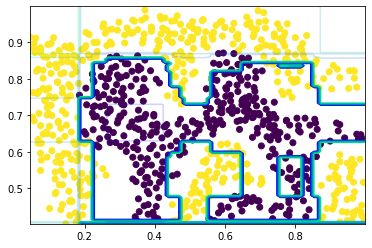

79


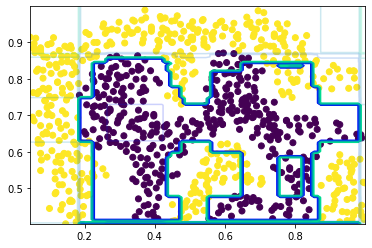

80


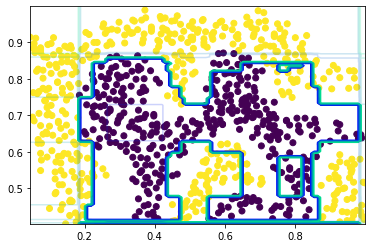

81


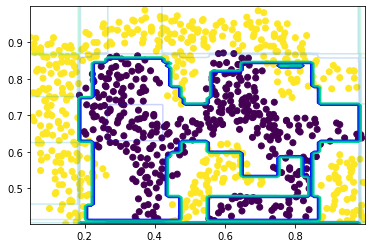

82


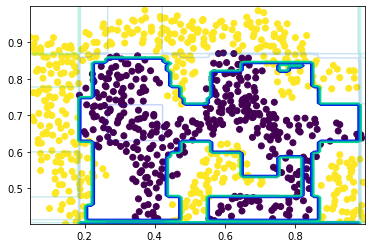

83


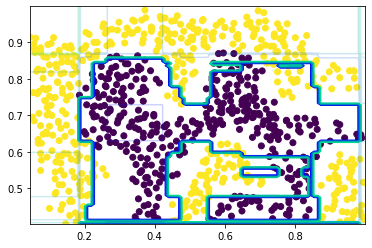

84


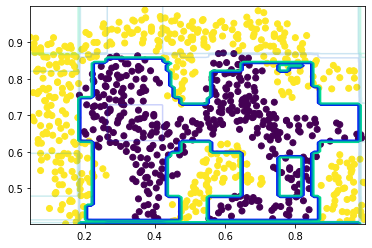

85


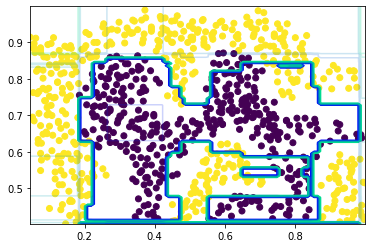

86


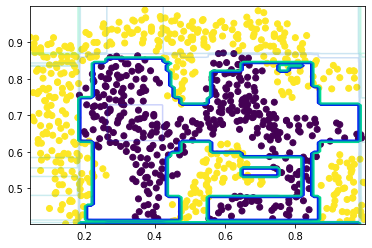

87


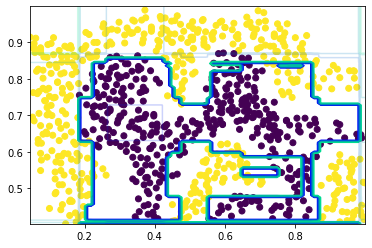

88


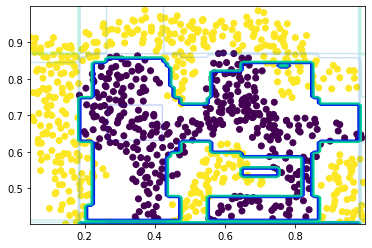

89


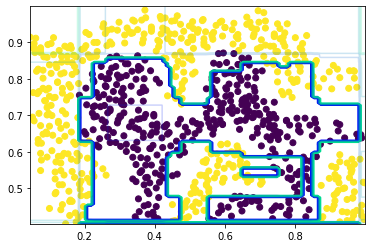

90


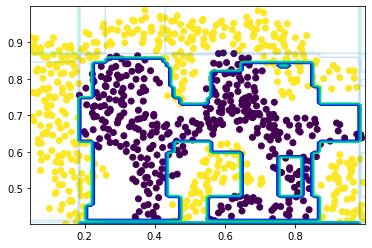

91


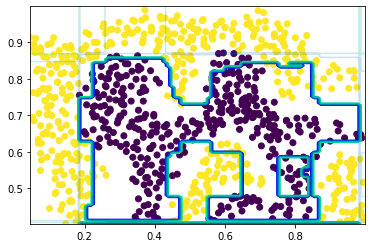

92


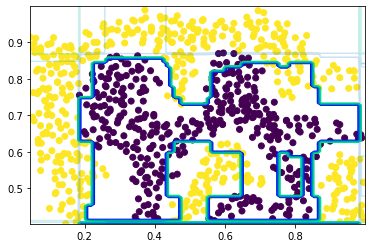

93


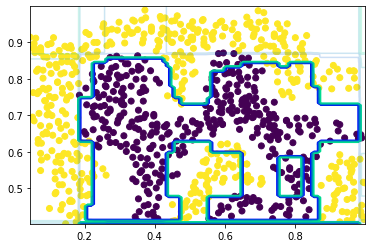

94


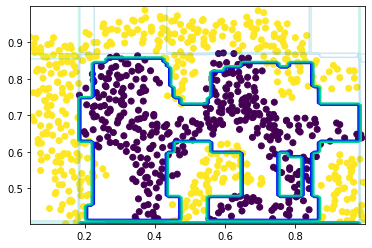

95


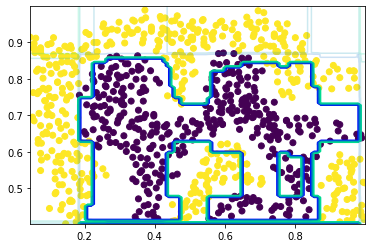

96


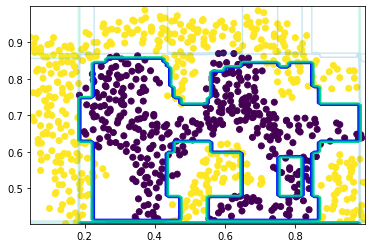

97


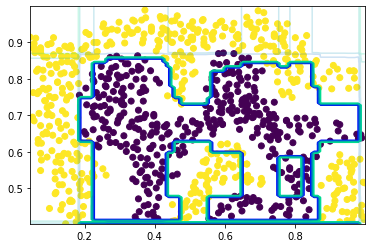

98


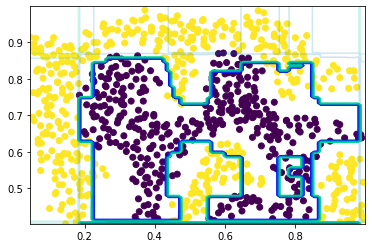

99


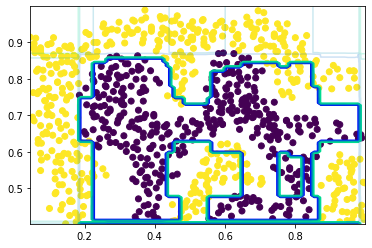

In [16]:
for i in range(1,100):
    print(i)
    # 定义SVM模型
    model = ensemble.AdaBoostClassifier(base_estimator=None, n_estimators=i, random_state=42)
    # 对模型进行训练
    model.fit(X_train, y_train.ravel())
    plt.scatter(X[:,0],X[:,1],c=y.flatten())
    plot_predict(model,[X[:,0].min(),X[:,0].max(),X[:,1].min(),X[:,0].max()])
    